# <font color="Green">Installation</font>

In [1]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 16.1 MB/s eta 0:00:00


# <font color="Green">Export</font>

In [2]:
from ultralytics import YOLO

model = YOLO("yolo26n.pt")
path = model.export(format="onnx", opset=13)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.13 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO26n summary (fused): 122 layers, 2,408,932 parameters, 0 gradients, 5.4 GFLOPs

PyTorch: starting from 'yolo26n.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 300, 6) (5.3 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.71', 'onnxruntime'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 12 packages in 320ms
Prepared 4 packages in 2.39s
Installed 4 packages in 551ms

/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/symbolic_opset9.py:5353: UserWarning: Exporting aten::index operator of advanced indexing in opset 13 is achieved by combination of multiple ONNX operators, including Reshape, Transpose, Concat, and Gather. If indices include negative values, the exported graph will produce incorrect results.
  warnings.warn(


ONNX: slimming with onnxslim 0.1.84...
ONNX: export success ✅ 7.4s, saved as 'yolo26n.onnx' (9.5 MB)

Export complete (8.7s)
Results saved to /content
Predict:         yolo predict task=detect model=yolo26n.onnx imgsz=640 
Validate:        yolo val task=detect model=yolo26n.onnx imgsz=640 data=/home/lq/codes/ultralytics/ultralytics/cfg/datasets/coco.yaml  
Visualize:       https://netron.app


# <font color="Green">Implementation</font>

Inference successful! Detections:

Box: [264, 343, 1621, 1136]  Conf: 0.95
Box: [55, 735, 258, 1302]  Conf: 0.90
Box: [1587, 792, 1694, 972]  Conf: 0.77
Box: [241, 951, 554, 1302]  Conf: 0.54


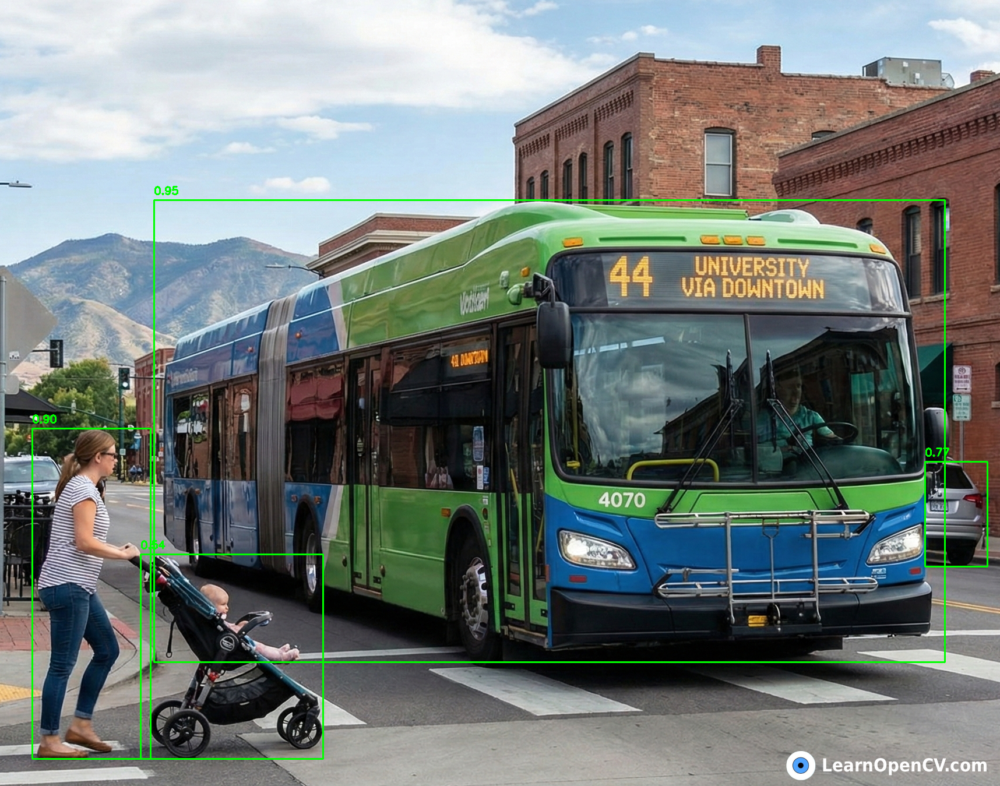


Saved to result_yolo26.jpg


In [5]:
import onnxruntime
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# ===============================
# 1. Load image
# ===============================
image_path = "YOLO26_Test_image.png"
original_img = cv2.imread(image_path)

if original_img is None:
    raise FileNotFoundError(f"Image not found at {image_path}")

h_orig, w_orig = original_img.shape[:2]

# ===============================
# 2. Preprocess
# ===============================
img = cv2.resize(original_img, (640, 640))
img = img.astype(np.float32) / 255.0
img = img.transpose(2, 0, 1)          # HWC -> CHW
image_data = np.expand_dims(img, 0)   # add batch

# ===============================
# 3. Inference
# ===============================
session = onnxruntime.InferenceSession("yolo26n.onnx")
inputs = {session.get_inputs()[0].name: image_data}
outputs = session.run(None, inputs)[0]

# ===============================
# 4. Post-process & Draw
# ===============================
scale_x = w_orig / 640
scale_y = h_orig / 640

print("Inference successful! Detections:\n")

for box in outputs[0]:
    conf = float(box[4])
    if conf > 0.5:
        x1, y1, x2, y2 = box[:4]

        # rescale
        x1 = int(x1 * scale_x)
        y1 = int(y1 * scale_y)
        x2 = int(x2 * scale_x)
        y2 = int(y2 * scale_y)

        print(f"Box: {[x1,y1,x2,y2]}  Conf: {conf:.2f}")

        # draw
        cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(original_img, f"{conf:.2f}", (x1, max(20, y1-10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

# ===============================
# 5. Show + Save
# ===============================
cv2_imshow(original_img)        # <-- shows in Colab
cv2.imwrite("result_yolo26.jpg", original_img)

print("\nSaved to result_yolo26.jpg")


Processing image... Found these objects:

 -> dog (0.92)
 -> person (0.91)


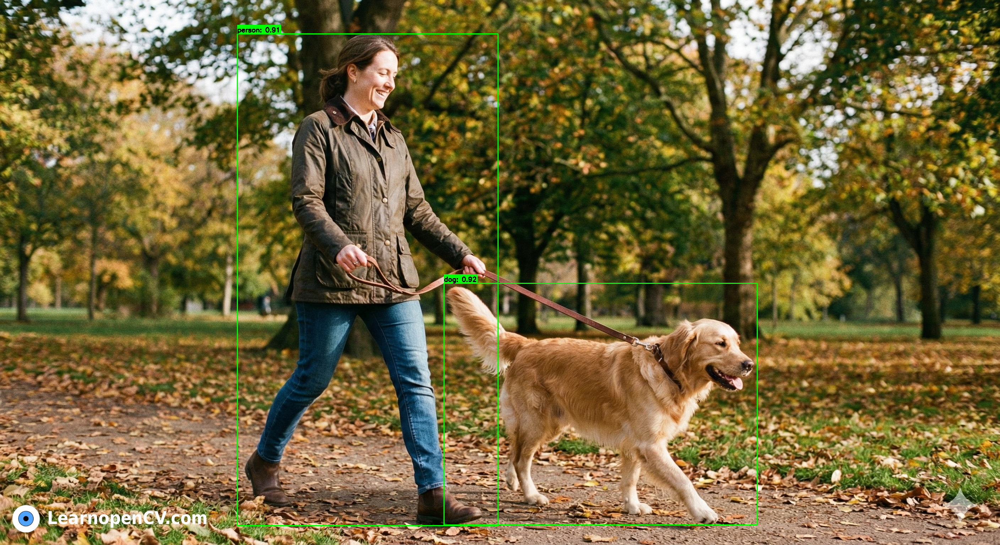

True

In [4]:
import onnxruntime
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# ===============================
# 1. SETUP: Define Class Names
# ===============================
# Need to define class labels to show class names along with the detection.
CLASSES = {
    0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus',
    6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant',
    11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat',
    16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear',
    22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag',
    27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard',
    32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove',
    36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle',
    40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl',
    46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli',
    51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake',
    56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table',
    61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard',
    67: 'cell phone', 68: 'microwave', 69: 'oven', 70: 'toaster', 71: 'sink',
    72: 'refrigerator', 73: 'book', 74: 'clock', 75: 'vase', 76: 'scissors',
    77: 'teddy bear', 78: 'hair drier', 79: 'toothbrush'
}

# ===============================
# 2. LOAD & PREPROCESS IMAGE
# ===============================
image_path = "Person_Dog.png"
original_img = cv2.imread(image_path)

if original_img is None:
    raise FileNotFoundError(f"Could not load image at {image_path}")
h_orig, w_orig = original_img.shape[:2]

img = cv2.resize(original_img, (640, 640))
img = img.astype(np.float32) / 255.0

img = img.transpose(2, 0, 1)

# Add Batch Dimension (1, 3, 640, 640)
image_data = np.expand_dims(img, 0)

# ===============================
# 3. RUN INFERENCE (ONNX)
# ===============================
session = onnxruntime.InferenceSession("yolo26n.onnx")

# Run the model
outputs = session.run(None, {session.get_inputs()[0].name: image_data})[0]
# Output shape is [1, 300, 6]

# ===============================
# 4. POST-PROCESSING
# ===============================
scale_x = w_orig / 640
scale_y = h_orig / 640

print(f"Processing image... Found these objects:\n")

for box in outputs[0]:
    confidence = box[4]

    if confidence > 0.50:
        x1, y1, x2, y2 = box[:4]
        class_id = int(box[5])

        class_name = CLASSES.get(class_id, "Unknown")

        x1 = int(x1 * scale_x)
        y1 = int(y1 * scale_y)
        x2 = int(x2 * scale_x)
        y2 = int(y2 * scale_y)

        print(f" -> {class_name} ({confidence:.2f})")

        cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        label = f"{class_name}: {confidence:.2f}"
        (w, h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
        cv2.rectangle(original_img, (x1, y1 - 25), (x1 + w, y1), (0, 255, 0), -1)
        cv2.putText(original_img, label, (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 2)

# ===============================
# 5. DISPLAY RESULT
# ===============================
cv2_imshow(original_img)
cv2.imwrite("output_person_dog.jpg", original_img)